
# Train a Two-Stage Detector on a Roboflow COCO Dataset

This Colab notebook trains a **Faster R-CNN** object detection model on a Roboflow dataset exported in **COCO format**.

Dataset used in this notebook:

```python
workspace = "tim-4ijf0"
project = "surgical-tools-yotlv-nvvoh"
version = 2
```

The workflow covers:

1. Installing dependencies  
2. Downloading the dataset from Roboflow  
3. Reading class names and class counts automatically  
4. Displaying sample annotated images using `supervision`  
5. Preparing a PyTorch COCO dataset and DataLoader  
6. Training Faster R-CNN  
7. Evaluating model performance with mAP metrics  
8. Running prediction on one validation image and visualizing the result  

**Security note:** Do not hardcode your Roboflow API key in a public notebook. Use Colab Secrets or enter it using `getpass`.


## 1. Install Required Libraries

We need Roboflow for dataset download, Supervision for visualization, Torch/Torchvision for Faster R-CNN, and TorchMetrics for object detection evaluation.

In [1]:

!pip -q install roboflow supervision pycocotools torchmetrics tensorboard


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.3/260.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 4.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
httpx2 2.4.0 requires idna>=3.18, but you have idna 3.7 which is incompatible.


## 2. Import Libraries

In [2]:

import os
import json
import random
from pathlib import Path
from collections import Counter

import cv2
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms.functional as F

from pycocotools.coco import COCO
from torchmetrics.detection.mean_ap import MeanAveragePrecision

import supervision as sv


## 3. Download the Dataset from Roboflow

This downloads your Roboflow project version in COCO format. Use Colab Secrets with the name `ROBOFLOW_API_KEY`, or enter your key when prompted.

In [3]:

from getpass import getpass

try:
    from google.colab import userdata
    ROBOFLOW_API_KEY = userdata.get("ROBOFLOW_API_KEY")
except Exception:
    ROBOFLOW_API_KEY = None

if not ROBOFLOW_API_KEY:
    ROBOFLOW_API_KEY = getpass("Enter Roboflow API key: ")

from roboflow import Roboflow

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("tim-4ijf0").project("surgical-tools-yotlv-nvvoh")
version = project.version(2)

dataset = version.download("coco")
DATASET_DIR = Path(dataset.location)

print("Dataset downloaded to:", DATASET_DIR)
print("Folders:", [p.name for p in DATASET_DIR.iterdir() if p.is_dir()])


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Surgical-Tools-2 in coco:: 100%|██████████| 514/514 [00:00<00:00, 8137.39it/s]

Dataset downloaded to: /content/Surgical-Tools-2
Folders: ['valid', 'train', 'test']


## 4. Read Class Names and Class Count Automatically

The COCO annotation file contains category names and image annotations. We will read the training annotations and count how many objects are available for each class.

In [13]:

TRAIN_ANN = DATASET_DIR / "train" / "_annotations.coco.json"
VALID_ANN = DATASET_DIR / "valid" / "_annotations.coco.json"
TEST_ANN = DATASET_DIR / "test" / "_annotations.coco.json"

with open(TRAIN_ANN, "r") as f:
    train_coco_json = json.load(f)

categories = train_coco_json["categories"]
cat_id_to_name = {cat["id"]: cat["name"] for cat in categories}
class_names = [cat["name"] for cat in categories]

# Faster R-CNN needs background class also
num_classes = len(class_names) + 1

class_counter = Counter()
for ann in train_coco_json["annotations"]:
    class_counter[cat_id_to_name[ann["category_id"]]] += 1

class_count_df = pd.DataFrame({
    "class_name": list(class_counter.keys()),
    "object_count": list(class_counter.values())
}).sort_values("object_count", ascending=False)

print("Number of object classes:", len(class_names))
print("Number of model classes including background:", num_classes)
print("Class names:", class_names)
display(class_count_df)


Number of object classes: 11
Number of model classes including background: 12
Class names: ['Scissors-dissectors-forceps', 'BP Handle', 'Babcock Tissue Forceps', 'Curved Mayo Scissors', 'Curved Needle holder', 'Dressing Scissors', 'Mayo Metzenbum Scissors', 'Mayo Needle Holder', 'Non-Toothed Dissector', 'Right-Angled Needle Holder', 'Toothed Dissector']


,class_name,object_count
3,Dressing Scissors,125
0,Mayo Needle Holder,103
1,Curved Needle holder,101
6,BP Handle,75
2,Babcock Tissue Forceps,58
5,Mayo Metzenbum Scissors,45
4,Non-Toothed Dissector,40
7,Toothed Dissector,30
9,Right-Angled Needle Holder,21
8,Curved Mayo Scissors,7


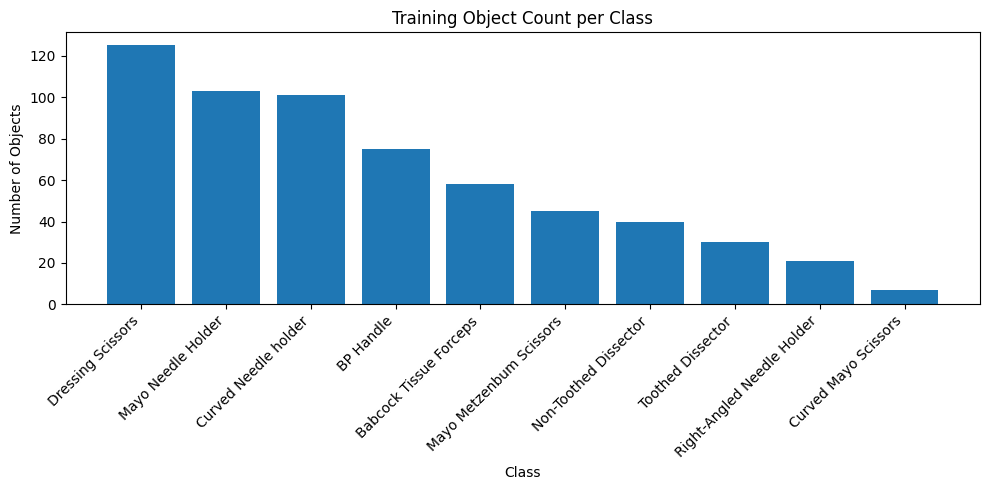

In [10]:

plt.figure(figsize=(10, 5))
plt.bar(class_count_df["class_name"], class_count_df["object_count"])
plt.xticks(rotation=45, ha="right")
plt.title("Training Object Count per Class")
plt.xlabel("Class")
plt.ylabel("Number of Objects")
plt.tight_layout()
plt.show()


## 5. Display Few Sample Images from the Dataset

Here we use the Roboflow `supervision` library to draw bounding boxes and class labels on a few training images.

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


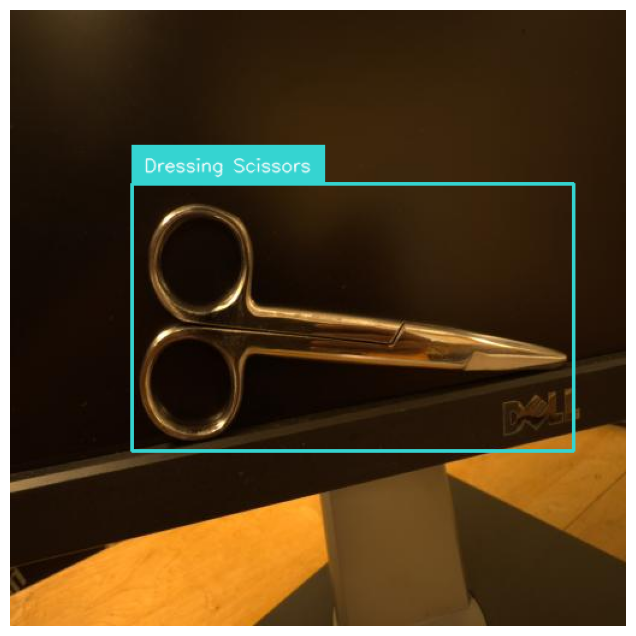

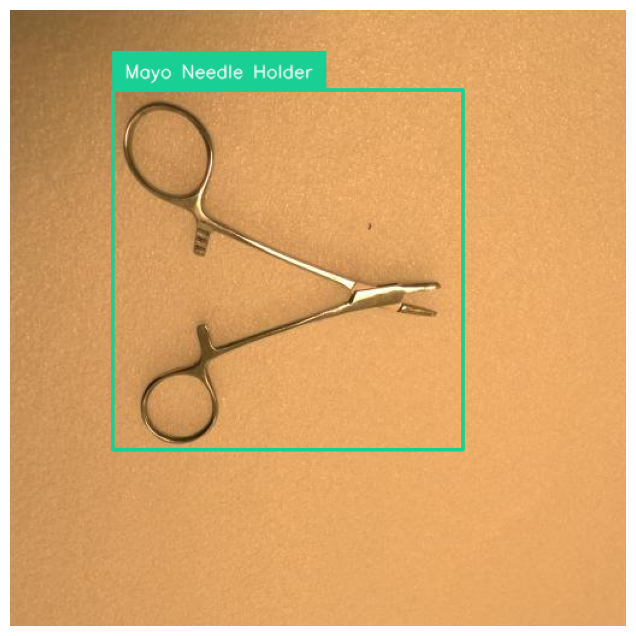

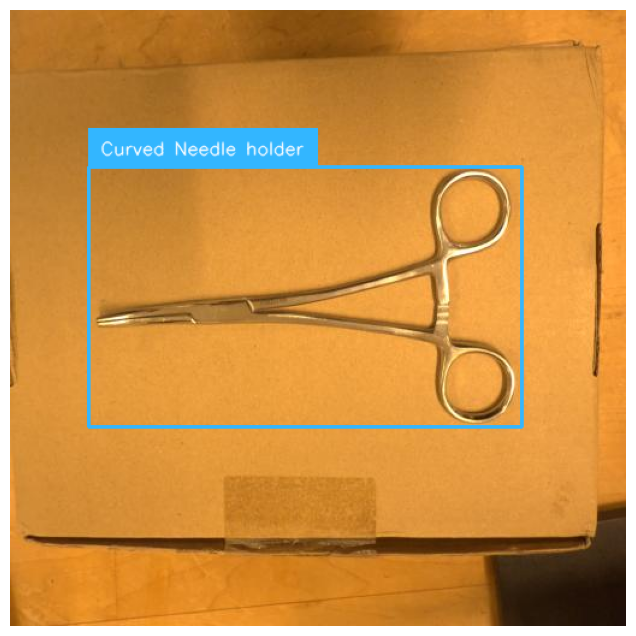

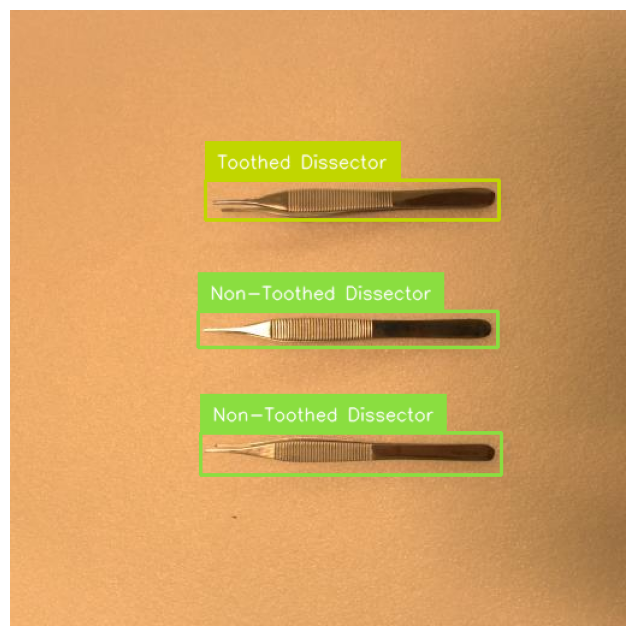

In [11]:

def get_supervision_annotators():
    # Supports both newer and older supervision versions.
    if hasattr(sv, "BoxAnnotator"):
        box_annotator = sv.BoxAnnotator()
    else:
        box_annotator = sv.BoundingBoxAnnotator()

    label_annotator = sv.LabelAnnotator() if hasattr(sv, "LabelAnnotator") else None
    return box_annotator, label_annotator


def annotate_with_supervision(image, detections, labels):
    box_annotator, label_annotator = get_supervision_annotators()

    try:
        annotated = box_annotator.annotate(
            scene=image.copy(),
            detections=detections
        )
        if label_annotator is not None:
            annotated = label_annotator.annotate(
                scene=annotated,
                detections=detections,
                labels=labels
            )
        else:
            # Older supervision versions accepted labels directly in BoxAnnotator
            annotated = box_annotator.annotate(
                scene=image.copy(),
                detections=detections,
                labels=labels
            )
    except TypeError:
        # Fallback for older API
        annotated = box_annotator.annotate(
            scene=image.copy(),
            detections=detections,
            labels=labels
        )

    return annotated


def load_coco_sample(coco, image_dir, image_id):
    img_info = coco.loadImgs(image_id)[0]
    img_path = image_dir / img_info["file_name"]

    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=image_id)
    anns = coco.loadAnns(ann_ids)

    boxes = []
    class_ids = []
    labels = []

    for ann in anns:
        x, y, w, h = ann["bbox"]
        if w <= 0 or h <= 0:
            continue

        boxes.append([x, y, x + w, y + h])
        class_ids.append(ann["category_id"])
        labels.append(cat_id_to_name[ann["category_id"]])

    if len(boxes) == 0:
        detections = sv.Detections.empty()
    else:
        detections = sv.Detections(
            xyxy=np.array(boxes, dtype=np.float32),
            class_id=np.array(class_ids, dtype=int)
        )

    return image, detections, labels


train_coco = COCO(str(TRAIN_ANN))
train_image_dir = DATASET_DIR / "train"

sample_ids = random.sample(train_coco.getImgIds(), k=min(4, len(train_coco.getImgIds())))

for image_id in sample_ids:
    image, detections, labels = load_coco_sample(train_coco, train_image_dir, image_id)
    annotated = annotate_with_supervision(image, detections, labels)

    plt.figure(figsize=(8, 8))
    plt.imshow(annotated)
    plt.axis("off")
    plt.show()


## 6. Create a PyTorch COCO Dataset

Torchvision Faster R-CNN expects each image with a target dictionary containing boxes and labels. COCO boxes are stored as `[x, y, width, height]`, so we convert them to `[x1, y1, x2, y2]`.

In [12]:
class RoboflowCocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, filter_empty=False):
        self.image_dir = Path(image_dir)
        self.coco = COCO(str(annotation_file))

        cats = self.coco.loadCats(self.coco.getCatIds())
        self.cat_id_to_contiguous = {
            cat["id"]: idx + 1 for idx, cat in enumerate(cats)
        }
        self.contiguous_to_name = {
            idx + 1: cat["name"] for idx, cat in enumerate(cats)
        }

        all_image_ids = self.coco.getImgIds()

        if filter_empty:
            self.image_ids = []
            for image_id in all_image_ids:
                ann_ids = self.coco.getAnnIds(imgIds=image_id)
                anns = self.coco.loadAnns(ann_ids)

                valid_boxes = [
                    ann for ann in anns
                    if ann["bbox"][2] > 0 and ann["bbox"][3] > 0
                ]

                if len(valid_boxes) > 0:
                    self.image_ids.append(image_id)
        else:
            self.image_ids = all_image_ids

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image_info = self.coco.loadImgs(image_id)[0]
        image_path = self.image_dir / image_info["file_name"]

        image = Image.open(image_path).convert("RGB")
        image = F.to_tensor(image)

        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)

        boxes = []
        labels = []
        area = []
        iscrowd = []

        for ann in anns:
            x, y, w, h = ann["bbox"]

            if w <= 0 or h <= 0:
                continue

            boxes.append([x, y, x + w, y + h])
            labels.append(self.cat_id_to_contiguous[ann["category_id"]])
            area.append(ann.get("area", w * h))
            iscrowd.append(ann.get("iscrowd", 0))

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            area = torch.as_tensor(area, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id]),
            "area": area,
            "iscrowd": iscrowd
        }

        return image, target

In [14]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = RoboflowCocoDetectionDataset(
    image_dir=DATASET_DIR / "train",
    annotation_file=TRAIN_ANN,
    filter_empty=True
)

valid_dataset = RoboflowCocoDetectionDataset(
    image_dir=DATASET_DIR / "valid",
    annotation_file=VALID_ANN,
    filter_empty=False
)

train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=2,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [15]:
print("Training images after filtering:", len(train_dataset))
print("Validation images:", len(valid_dataset))

Training images after filtering: 352
Validation images: 102


## 7. Create the Faster R-CNN Model

We use `fasterrcnn_resnet50_fpn` from Torchvision. Since our dataset has custom surgical tool classes, we replace the final prediction head.

In [16]:

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Using device:", device)

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

# Replace the classification head for your custom number of classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.to(device)


Using device: cuda
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:01<00:00, 148MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## 8. Train the Model

For a blog demo, start with a small number of epochs. Increase `NUM_EPOCHS` if you want better accuracy.

In [17]:

optimizer = torch.optim.SGD(
    model.parameters(),
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

NUM_EPOCHS = 5

train_loss_history = []

def evaluate_model_map(model, data_loader, device, max_batches=None):
    metric = MeanAveragePrecision(
        box_format="xyxy",
        class_metrics=True
    )

    model.eval()

    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(data_loader):
            if max_batches is not None and batch_idx >= max_batches:
                break

            images = [img.to(device) for img in images]
            outputs = model(images)

            preds = []
            gt_targets = []

            for output in outputs:
                preds.append({
                    "boxes": output["boxes"].detach().cpu(),
                    "scores": output["scores"].detach().cpu(),
                    "labels": output["labels"].detach().cpu()
                })

            for target in targets:
                gt_targets.append({
                    "boxes": target["boxes"].detach().cpu(),
                    "labels": target["labels"].detach().cpu()
                })

            metric.update(preds, gt_targets)

    results = metric.compute()
    return results

writer = SummaryWriter("runs/fasterrcnn_surgical_tools")

NUM_EPOCHS = 5
EVAL_EVERY = 1

history = []

loss_keys = [
    "loss_classifier",
    "loss_box_reg",
    "loss_objectness",
    "loss_rpn_box_reg"
]

for epoch in range(NUM_EPOCHS):
    model.train()

    running_losses = {
        "total_loss": 0.0,
        "loss_classifier": 0.0,
        "loss_box_reg": 0.0,
        "loss_objectness": 0.0,
        "loss_rpn_box_reg": 0.0
    }

    progress_bar = tqdm(
        train_loader,
        desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}"
    )

    for images, targets in progress_bar:
        images = [img.to(device) for img in images]

        targets = [
            {k: v.to(device) for k, v in target.items()}
            for target in targets
        ]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        running_losses["total_loss"] += losses.item()

        for key in loss_keys:
            if key in loss_dict:
                running_losses[key] += loss_dict[key].item()

        progress_bar.set_postfix({
            "loss": f"{losses.item():.4f}"
        })

    lr_scheduler.step()

    num_batches = len(train_loader)

    epoch_result = {
        "epoch": epoch + 1
    }

    for key, value in running_losses.items():
        avg_value = value / num_batches
        epoch_result[key] = avg_value
        writer.add_scalar(f"train/{key}", avg_value, epoch + 1)

    if (epoch + 1) % EVAL_EVERY == 0:
        val_results = evaluate_model_map(
            model=model,
            data_loader=valid_loader,
            device=device
        )

        epoch_result["map"] = float(val_results["map"])
        epoch_result["map_50"] = float(val_results["map_50"])
        epoch_result["map_75"] = float(val_results["map_75"])
        epoch_result["mar_100"] = float(val_results["mar_100"])

        writer.add_scalar("val/mAP", epoch_result["map"], epoch + 1)
        writer.add_scalar("val/mAP_50", epoch_result["map_50"], epoch + 1)
        writer.add_scalar("val/mAP_75", epoch_result["map_75"], epoch + 1)
        writer.add_scalar("val/mAR_100", epoch_result["mar_100"], epoch + 1)

    history.append(epoch_result)

    print("\nEpoch Summary")
    print("-------------")
    print(f"Epoch:              {epoch + 1}")
    print(f"Total Loss:         {epoch_result['total_loss']:.4f}")
    print(f"Classifier Loss:    {epoch_result['loss_classifier']:.4f}")
    print(f"Box Reg Loss:       {epoch_result['loss_box_reg']:.4f}")
    print(f"Objectness Loss:    {epoch_result['loss_objectness']:.4f}")
    print(f"RPN Box Reg Loss:   {epoch_result['loss_rpn_box_reg']:.4f}")

    if "map" in epoch_result:
        print(f"Validation mAP:     {epoch_result['map']:.4f}")
        print(f"Validation mAP@50:  {epoch_result['map_50']:.4f}")
        print(f"Validation mAP@75:  {epoch_result['map_75']:.4f}")
        print(f"Validation mAR@100: {epoch_result['mar_100']:.4f}")

    print()

writer.close()


Epoch 1/5:   0%|          | 0/176 [00:00<?, ?it/s]


Epoch Summary
-------------
Epoch:              1
Total Loss:         0.3828
Classifier Loss:    0.2002
Box Reg Loss:       0.1615
Objectness Loss:    0.0087
RPN Box Reg Loss:   0.0124
Validation mAP:     0.2551
Validation mAP@50:  0.4211
Validation mAP@75:  0.3146
Validation mAR@100: 0.5542



Epoch 2/5:   0%|          | 0/176 [00:00<?, ?it/s]


Epoch Summary
-------------
Epoch:              2
Total Loss:         0.2315
Classifier Loss:    0.1317
Box Reg Loss:       0.0895
Objectness Loss:    0.0024
RPN Box Reg Loss:   0.0080
Validation mAP:     0.3645
Validation mAP@50:  0.5698
Validation mAP@75:  0.4207
Validation mAR@100: 0.6240



Epoch 3/5:   0%|          | 0/176 [00:00<?, ?it/s]


Epoch Summary
-------------
Epoch:              3
Total Loss:         0.1846
Classifier Loss:    0.0986
Box Reg Loss:       0.0765
Objectness Loss:    0.0015
RPN Box Reg Loss:   0.0080
Validation mAP:     0.4331
Validation mAP@50:  0.6963
Validation mAP@75:  0.5038
Validation mAR@100: 0.6667



Epoch 4/5:   0%|          | 0/176 [00:00<?, ?it/s]


Epoch Summary
-------------
Epoch:              4
Total Loss:         0.1251
Classifier Loss:    0.0705
Box Reg Loss:       0.0491
Objectness Loss:    0.0012
RPN Box Reg Loss:   0.0044
Validation mAP:     0.5567
Validation mAP@50:  0.7437
Validation mAP@75:  0.6607
Validation mAR@100: 0.7703



Epoch 5/5:   0%|          | 0/176 [00:00<?, ?it/s]


Epoch Summary
-------------
Epoch:              5
Total Loss:         0.1071
Classifier Loss:    0.0620
Box Reg Loss:       0.0406
Objectness Loss:    0.0010
RPN Box Reg Loss:   0.0035
Validation mAP:     0.5902
Validation mAP@50:  0.7675
Validation mAP@75:  0.7075
Validation mAR@100: 0.7791



## 9. Evaluate Model Performance

We evaluate the model on the validation set using common object detection metrics such as mAP and mAP@50.

In [18]:
history_df = pd.DataFrame(history)
display(history_df)

,epoch,total_loss,loss_classifier,loss_box_reg,loss_objectness,loss_rpn_box_reg,map,map_50,map_75,mar_100
0,1,0.382802,0.200190,0.161544,0.008697,0.012371,0.255146,0.421099,0.314628,0.554159
1,2,0.231530,0.131663,0.089468,0.002414,0.007986,0.364512,0.569771,0.420716,0.624048
2,3,0.184623,0.098647,0.076547,0.001456,0.007972,0.433092,0.696250,0.503762,0.666678
3,4,0.125149,0.070464,0.049082,0.001212,0.004390,0.556702,0.743729,0.660687,0.770292
4,5,0.107138,0.061990,0.040639,0.001038,0.003471,0.590174,0.767461,0.707457,0.779136


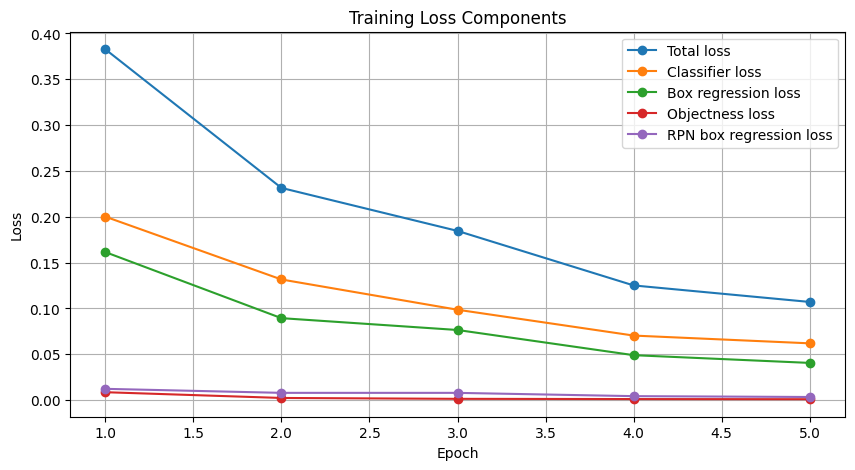

In [19]:
plt.figure(figsize=(10, 5))

plt.plot(history_df["epoch"], history_df["total_loss"], marker="o", label="Total loss")
plt.plot(history_df["epoch"], history_df["loss_classifier"], marker="o", label="Classifier loss")
plt.plot(history_df["epoch"], history_df["loss_box_reg"], marker="o", label="Box regression loss")
plt.plot(history_df["epoch"], history_df["loss_objectness"], marker="o", label="Objectness loss")
plt.plot(history_df["epoch"], history_df["loss_rpn_box_reg"], marker="o", label="RPN box regression loss")

plt.title("Training Loss Components")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

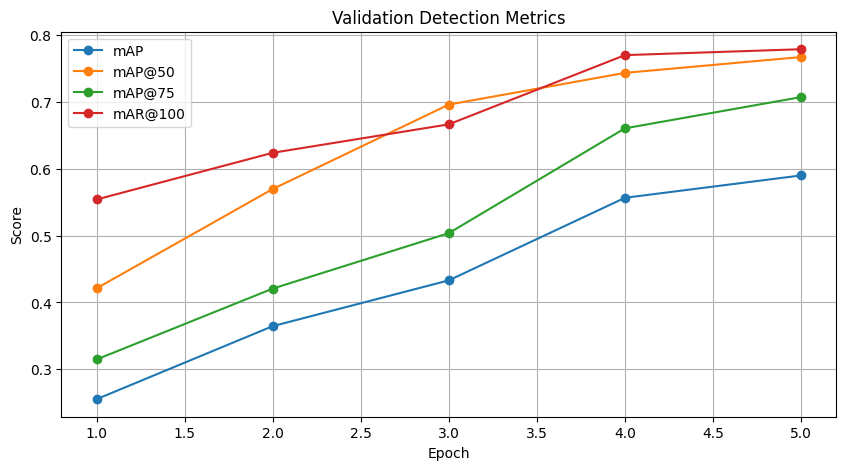

In [20]:
plt.figure(figsize=(10, 5))

plt.plot(history_df["epoch"], history_df["map"], marker="o", label="mAP")
plt.plot(history_df["epoch"], history_df["map_50"], marker="o", label="mAP@50")
plt.plot(history_df["epoch"], history_df["map_75"], marker="o", label="mAP@75")
plt.plot(history_df["epoch"], history_df["mar_100"], marker="o", label="mAR@100")

plt.title("Validation Detection Metrics")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.show()

### Per-Class mAP

This cell prints per-class mAP where available. The class labels are mapped back to the dataset class names.

In [21]:
final_results = evaluate_model_map(
    model=model,
    data_loader=valid_loader,
    device=device
)

if "map_per_class" in final_results:
    per_class_rows = []

    map_per_class = final_results["map_per_class"]
    classes = final_results.get(
        "classes",
        torch.arange(1, len(map_per_class) + 1)
    )

    for class_id, map_value in zip(classes, map_per_class):
        class_id = int(class_id)
        map_value = float(map_value)

        class_name = train_dataset.contiguous_to_name.get(
            class_id,
            f"class_{class_id}"
        )

        per_class_rows.append({
            "class_id": class_id,
            "class_name": class_name,
            "mAP": map_value
        })

    per_class_df = pd.DataFrame(per_class_rows)
    display(per_class_df)
else:
    print("Per-class mAP is not available.")

,class_id,class_name,mAP
0,2,BP Handle,0.520102
1,3,Babcock Tissue Forceps,0.481443
2,4,Curved Mayo Scissors,-1.000000
3,5,Curved Needle holder,0.714032
4,6,Dressing Scissors,0.798494
5,7,Mayo Metzenbum Scissors,0.636217
6,8,Mayo Needle Holder,0.685036
7,9,Non-Toothed Dissector,0.436335
8,10,Right-Angled Needle Holder,0.809052
9,11,Toothed Dissector,0.230857


In [22]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## 10. Run Prediction

Now we test the trained model on test image and display the result using Supervision.

In [23]:
from pycocotools.coco import COCO
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms.functional as F
import supervision as sv

TEST_ANN = DATASET_DIR / "test" / "_annotations.coco.json"
test_coco = COCO(str(TEST_ANN))

# Map COCO image file names to image IDs
file_name_to_id = {
    img_info["file_name"]: img_id
    for img_id, img_info in test_coco.imgs.items()
}

# COCO category id to contiguous id used by Faster R-CNN
cat_id_to_contiguous = train_dataset.cat_id_to_contiguous
contiguous_to_name = train_dataset.contiguous_to_name

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [24]:
def compute_iou(box1, box2):
    """
    box format: [x1, y1, x2, y2]
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    inter_area = inter_w * inter_h

    box1_area = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    box2_area = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area

    if union_area == 0:
        return 0

    return inter_area / union_area

In [25]:
def predict_and_compare_with_ground_truth(
    image_path,
    score_threshold=0.5,
    iou_threshold=0.5
):
    model.eval()

    image_path = Path(image_path)
    image_pil = Image.open(image_path).convert("RGB")
    image = np.array(image_pil)

    # -----------------------------
    # 1. Load ground truth
    # -----------------------------
    image_id = file_name_to_id[image_path.name]

    ann_ids = test_coco.getAnnIds(imgIds=image_id)
    anns = test_coco.loadAnns(ann_ids)

    gt_boxes = []
    gt_labels = []

    for ann in anns:
        x, y, w, h = ann["bbox"]

        if w <= 0 or h <= 0:
            continue

        gt_boxes.append([x, y, x + w, y + h])
        gt_labels.append(cat_id_to_contiguous[ann["category_id"]])

    gt_boxes = np.array(gt_boxes, dtype=np.float32)
    gt_labels = np.array(gt_labels, dtype=int)

    # -----------------------------
    # 2. Run prediction
    # -----------------------------
    image_tensor = F.to_tensor(image_pil).to(device)

    with torch.no_grad():
        output = model([image_tensor])[0]

    pred_boxes = output["boxes"].detach().cpu().numpy()
    pred_scores = output["scores"].detach().cpu().numpy()
    pred_labels = output["labels"].detach().cpu().numpy()

    keep = pred_scores >= score_threshold

    pred_boxes = pred_boxes[keep]
    pred_scores = pred_scores[keep]
    pred_labels = pred_labels[keep]

    # -----------------------------
    # 3. Compare prediction with GT
    # -----------------------------
    matched_gt = set()
    true_positive = 0
    false_positive = 0

    comparison_rows = []

    for pred_idx, pred_box in enumerate(pred_boxes):
        pred_label = pred_labels[pred_idx]
        pred_score = pred_scores[pred_idx]

        best_iou = 0
        best_gt_idx = -1

        for gt_idx, gt_box in enumerate(gt_boxes):
            if gt_idx in matched_gt:
                continue

            gt_label = gt_labels[gt_idx]

            # Match only with same class
            if pred_label != gt_label:
                continue

            iou = compute_iou(pred_box, gt_box)

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx

        if best_iou >= iou_threshold:
            true_positive += 1
            matched_gt.add(best_gt_idx)
            status = "TP"
        else:
            false_positive += 1
            status = "FP"

        comparison_rows.append({
            "prediction_class": contiguous_to_name.get(int(pred_label), str(pred_label)),
            "confidence": round(float(pred_score), 3),
            "best_iou": round(float(best_iou), 3),
            "status": status
        })

    false_negative = len(gt_boxes) - len(matched_gt)

    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0

    # -----------------------------
    # 4. Create Supervision detections
    # -----------------------------
    if len(gt_boxes) > 0:
        gt_detections = sv.Detections(
            xyxy=gt_boxes,
            class_id=gt_labels
        )

        gt_display_labels = [
            f"GT: {contiguous_to_name.get(int(label), str(label))}"
            for label in gt_labels
        ]

        gt_annotated = annotate_with_supervision(
            image.copy(),
            gt_detections,
            gt_display_labels
        )
    else:
        gt_annotated = image.copy()

    if len(pred_boxes) > 0:
        pred_detections = sv.Detections(
            xyxy=pred_boxes.astype(np.float32),
            confidence=pred_scores.astype(np.float32),
            class_id=pred_labels.astype(int)
        )

        pred_display_labels = [
            f"Pred: {contiguous_to_name.get(int(label), str(label))} {score:.2f}"
            for label, score in zip(pred_labels, pred_scores)
        ]

        pred_annotated = annotate_with_supervision(
            image.copy(),
            pred_detections,
            pred_display_labels
        )
    else:
        pred_annotated = image.copy()

    # -----------------------------
    # 5. Display side-by-side result
    # -----------------------------
    plt.figure(figsize=(16, 8))

    plt.subplot(1, 2, 1)
    plt.imshow(gt_annotated)
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_annotated)
    plt.title("Model Prediction")
    plt.axis("off")

    plt.show()

    # -----------------------------
    # 6. Print comparison summary
    # -----------------------------
    print("Prediction image:", image_path.name)
    print("Score threshold:", score_threshold)
    print("IoU threshold:", iou_threshold)
    print()
    print("Comparison Summary")
    print("------------------")
    print("Ground truth objects:", len(gt_boxes))
    print("Predicted objects:", len(pred_boxes))
    print("True Positives:", true_positive)
    print("False Positives:", false_positive)
    print("False Negatives:", false_negative)
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")

    if len(comparison_rows) > 0:
        display(pd.DataFrame(comparison_rows))
    else:
        print("No predictions above threshold.")

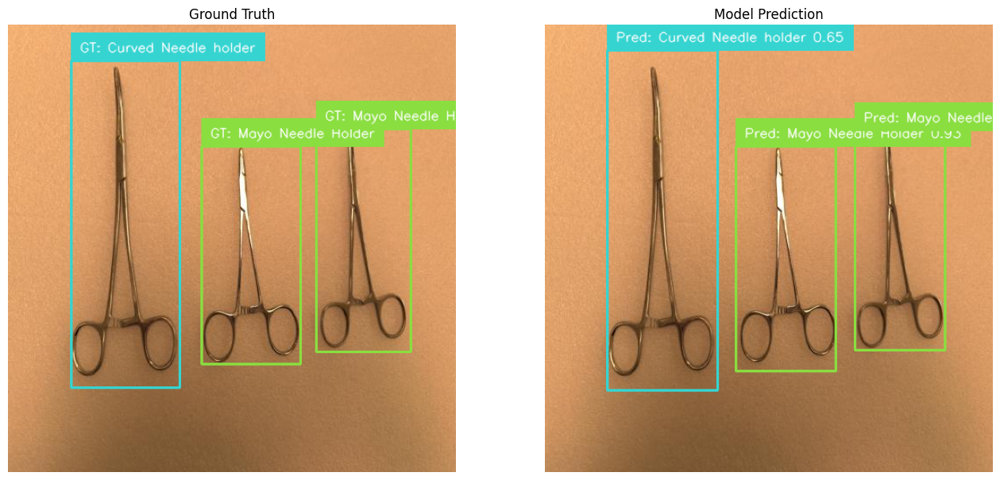

Prediction image: IMG_4271_jpg.rf.4d96b89b345f35c548ebd2d565f2d664.jpg
Score threshold: 0.5
IoU threshold: 0.5

Comparison Summary
------------------
Ground truth objects: 3
Predicted objects: 3
True Positives: 3
False Positives: 0
False Negatives: 0
Precision: 1.0000
Recall:    1.0000


,prediction_class,confidence,best_iou,status
0,Mayo Needle Holder,0.933,0.924,TP
1,Mayo Needle Holder,0.812,0.934,TP
2,Curved Needle holder,0.654,0.947,TP


In [28]:
valid_images = (
    list((DATASET_DIR / "test").glob("*.jpg")) +
    list((DATASET_DIR / "test").glob("*.png")) +
    list((DATASET_DIR / "test").glob("*.jpeg"))
)

sample_image_path = random.choice(valid_images)

predict_and_compare_with_ground_truth(
    sample_image_path,
    score_threshold=0.5,
    iou_threshold=0.5
)

## 11. Save the Trained Model

Save the model weights so you can use them later for inference or further fine-tuning.

In [ ]:

MODEL_PATH = "fasterrcnn_surgical_tools.pth"
torch.save({
    "model_state_dict": model.state_dict(),
    "class_names": class_names,
    "num_classes": num_classes
}, MODEL_PATH)

print("Model saved to:", MODEL_PATH)



## Notes for Better Results

- Increase `NUM_EPOCHS` for better training.
- Use more annotated images if the model misses some tools.
- Check the class count table. If one class has very few examples, the model may perform poorly for that class.
- Review sample annotations visually before training.
- Try lower or higher prediction thresholds depending on whether you want more recall or fewer false positives.
- If objects are very small, consider using higher image resolution or tiling in Roboflow before export.
